2️⃣ Cấu trúc mô hình (tóm tắt cho báo cáo)
🔹 Tên mô hình: CustomMobileNet (MTL-CNN V1)
🔹 Số lớp: 13 nhóm chính (Depthwise Separable Blocks)
🔹 Đầu vào: Ảnh RGB 224×224
🔹 Đầu ra: 33 lớp món ăn Việt Nam
🔹 Đặc trưng:
Dựa theo kiến trúc MobileNetV1,
Dùng Depthwise + Pointwise Conv để giảm số tham số,
Có Global Average Pooling, tránh Flatten truyền thống,
Chạy nhanh, tiết kiệm bộ nhớ.

In [2]:
from torchinfo import summary
from model.mtl_cnn import mtl_cnn_v1

num_classes = 33
model = mtl_cnn_v1(num_classes)

summary(model, input_size=(1, 3, 224, 224), col_names=["input_size", "output_size", "num_params"], depth=3)

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
CustomMobileNet                          [1, 3, 224, 224]          [1, 33]                   --
├─Sequential: 1-1                        [1, 3, 224, 224]          [1, 1024, 1, 1]           --
│    └─Conv2d: 2-1                       [1, 3, 224, 224]          [1, 32, 112, 112]         864
│    └─BatchNorm2d: 2-2                  [1, 32, 112, 112]         [1, 32, 112, 112]         64
│    └─ReLU: 2-3                         [1, 32, 112, 112]         [1, 32, 112, 112]         --
│    └─Sequential: 2-4                   [1, 32, 112, 112]         [1, 64, 112, 112]         --
│    │    └─Conv2d: 3-1                  [1, 32, 112, 112]         [1, 32, 112, 112]         288
│    │    └─BatchNorm2d: 3-2             [1, 32, 112, 112]         [1, 32, 112, 112]         64
│    │    └─ReLU: 3-3                    [1, 32, 112, 112]         [1, 32, 112, 112]         --
│    │    └─Conv2d: 3-4          


(process:9488): Pango-WARNING **: 16:46:31.287: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.

(process:2924): Pango-WARNING **: 16:46:32.282: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


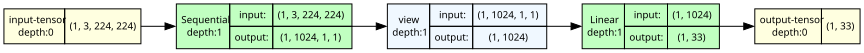

In [3]:
from torchview import draw_graph
import torch
from model.mtl_cnn import mtl_cnn_v1

model = mtl_cnn_v1(num_classes=33).eval()
example_input = torch.randn(1, 3, 224, 224)

g = draw_graph(
    model,
    input_data=example_input,
    expand_nested=False,   # 🔹 chỉ hiển thị các block chính
    depth=1,               # 🔹 giảm số tầng hiển thị
    graph_name="MTL-CNN"
)

# chỉnh lại hướng
dot = g.visual_graph
dot.graph_attr.update(rankdir="LR")
dot.render("images/mtl_cnn_simple", format="png", cleanup=True)
dot

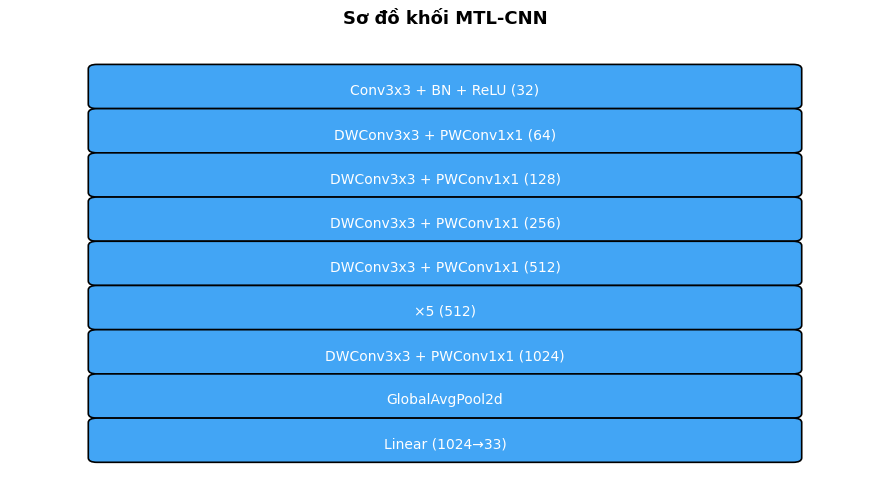

In [4]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

blocks = [
    "Conv3x3 + BN + ReLU (32)",
    "DWConv3x3 + PWConv1x1 (64)",
    "DWConv3x3 + PWConv1x1 (128)",
    "DWConv3x3 + PWConv1x1 (256)",
    "DWConv3x3 + PWConv1x1 (512)",
    "×5 (512)",
    "DWConv3x3 + PWConv1x1 (1024)",
    "GlobalAvgPool2d",
    "Linear (1024→33)"
]

fig, ax = plt.subplots(figsize=(9, 5))
ax.axis('off')
y = 0.9
for b in blocks:
    rect = patches.FancyBboxPatch((0.1, y-0.05), 0.8, 0.08, boxstyle="round,pad=0.01",
                                  facecolor="#42A5F5", edgecolor="black", lw=1.2)
    ax.add_patch(rect)
    ax.text(0.5, y-0.02, b, ha='center', va='center', fontsize=10, color='white')
    y -= 0.1
    if y < 0.05: break
ax.set_title("Sơ đồ khối MTL-CNN", fontsize=13, fontweight="bold", pad=10)
plt.tight_layout()
plt.show()




In [5]:
# pip install graphviz
from graphviz import Digraph
import textwrap, os

os.makedirs("images", exist_ok=True)

def wrap_html(text, width=24):
    # chuyển chuỗi dài thành nhiều dòng với <BR/>
    lines = textwrap.fill(text, width=width).split("\n")
    return "<BR/>".join(lines)

g = Digraph(
    "MTL_CNN_Compact",
    format="png",
    graph_attr={
        "rankdir": "LR",      # trái -> phải
        "dpi": "220",         # 🔹 tăng độ phân giải ảnh
        "nodesep": "0.6",
        "ranksep": "0.8",
        "bgcolor": "white",
        "fontname": "Segoe UI",
        "labelloc": "t",
        "fontsize": "16",
    },
    node_attr={
        "shape": "box",
        "style": "rounded,filled",
        "color": "#2b7bbb",
        "fillcolor": "#e9f3ff",
        "fontname": "Segoe UI",
        "fontsize": "14",     # 🔹 chữ to hơn
        "margin": "0.10,0.06",# 🔹 padding trong node
        "penwidth": "1.4",
        "width": "2.4",       # 🔹 gợi ý bề ngang (không cố định)
        "height": "0.9",
    },
    edge_attr={"penwidth": "1.8", "color": "#333333"},
)

blocks = [
    ("Input", "Ảnh RGB 128×128×3"),
    ("ConvBlock1", "2×Conv2D + ReLU + MaxPool (64 filters)"),
    ("ConvBlock2", "2×Conv2D + ReLU + MaxPool (128 filters)"),
    ("ConvBlock3", "2×Conv2D + ReLU + MaxPool (256 filters)"),
    ("ConvBlock4", "2×Conv2D + ReLU + MaxPool (512 filters)"),
    ("Flatten", "Chuyển sang vector 1D"),
    ("FC1", "Dense 128 + ReLU + Dropout"),
    ("Output", "Dense 33 + Softmax"),
]

# Dùng nhãn HTML để tự rớt dòng (title đậm + description wrap)
for i, (name, desc) in enumerate(blocks):
    label = f'<<B>{name}</B><BR/>{wrap_html(desc, width=28)}>'
    g.node(name, label=label)
    if i > 0:
        g.edge(blocks[i-1][0], name)

out = g.render("images/mtl_cnn_overview_big", cleanup=True)
print("✅ Đã lưu:", out)


✅ Đã lưu: images\mtl_cnn_overview_big.png


In [6]:
from graphviz import Digraph
import os
os.makedirs("images", exist_ok=True)

g = Digraph("CustomMobileNet", format="png")
g.attr(rankdir="LR", fontsize="12", fontname="Segoe UI", nodesep="0.6", ranksep="0.8")

def node(name, label):
    g.node(name, f"{name}\n{label}", shape="box", style="rounded,filled",
           fillcolor="#E8F1FF", color="#007ACC", fontname="Segoe UI")

node("Input", "Ảnh RGB\n128×128×3")
node("Conv1", "Conv2D 3×3\nstride=2, out=32")
node("DW_1", "Depthwise+Pointwise\n32→64")
node("DW_2", "Depthwise+Pointwise\n64→128 (s=2)")
node("DW_3", "Depthwise+Pointwise\n128→128")
node("DW_4", "Depthwise+Pointwise\n128→256 (s=2)")
node("DW_5", "Depthwise+Pointwise\n256→256")
node("DW_6", "Depthwise+Pointwise\n256→512 (s=2)")
node("DW_7", "5×Depthwise+Pointwise\n512→512")
node("DW_8", "Depthwise+Pointwise\n512→1024 (s=2)")
node("DW_9", "Depthwise+Pointwise\n1024→1024")
node("Pool", "AdaptiveAvgPool2D(1)")
node("FC", "Linear 1024→33\nSoftmax")

# nối khối
layers = ["Input","Conv1","DW_1","DW_2","DW_3","DW_4","DW_5","DW_6","DW_7","DW_8","DW_9","Pool","FC"]
for i in range(len(layers)-1):
    g.edge(layers[i], layers[i+1])

g.render("images/custom_mobilenet_structure", cleanup=True)
print("✅ Lưu tại: images/custom_mobilenet_structure.png")


✅ Lưu tại: images/custom_mobilenet_structure.png


In [7]:
# === VẼ SƠ ĐỒ KIẾN TRÚC CNN: 2 HÀNG, TRÁI→PHẢI ===
from graphviz import Digraph
import os

def draw_overview_2rows(save_dir="images", filename="mtl_cnn_overview_2rows", fmt="png"):
    os.makedirs(save_dir, exist_ok=True)

    g = Digraph("MTL-CNN", format=fmt, engine="dot")
    # Bố cục & thẩm mỹ (A4 ngang, nét thẳng, chữ dễ đọc)
    g.attr(rankdir="LR", splines="ortho", concentrate="true")
    g.attr(size="11.7,8.3!", ratio="compress", margin="0.1")  # A4 landscape ~ 11.7 x 8.3 in
    g.attr(fontname="DejaVu Sans")  # hoặc Arial

    # Style node thống nhất
    node_style = {
        "shape": "box",
        "style": "rounded,filled",
        "fillcolor": "#E6F4EA",
        "color": "#2C7BE5",
        "penwidth": "1.4",
        "fontsize": "10",
        "fontname": "DejaVu Sans",
    }
    g.attr("node", **node_style)
    g.attr("edge", arrowsize="0.7", color="#222", penwidth="1.2")

    # ===== HÀNG 1 (row1): Input → ConvBlock1 → ConvBlock2 → ConvBlock3
    with g.subgraph(name="cluster_row1") as row1:
        row1.attr(rank="same")  # giữ cùng 1 hàng
        row1.node("inp",  "Input\nẢnh RGB\n128×128×3")
        row1.node("b1",   "ConvBlock1\n2×Conv2D+ReLU\n+ MaxPool (64 filters)")
        row1.node("b2",   "ConvBlock2\n2×Conv2D+ReLU\n+ MaxPool (128 filters)")
        row1.node("b3",   "ConvBlock3\n2×Conv2D+ReLU\n+ MaxPool (256 filters)")

    # ===== HÀNG 2 (row2): ConvBlock4 → Flatten → FC → Output
    with g.subgraph(name="cluster_row2") as row2:
        row2.attr(rank="same")  # giữ cùng 1 hàng
        row2.node("b4",   "ConvBlock4\n2×Conv2D+ReLU\n+ MaxPool (512 filters)")
        row2.node("flat", "Flatten\nChuyển sang vector 1D")
        row2.node("fc1",  "FC1\nDense 128 + ReLU + Dropout")
        row2.node("out",  "Output\nDense 33\nSoftmax")

    # ===== Luồng chính: HÀNG 1 (→) sau đó “rớt” xuống HÀNG 2 rồi đi tiếp →
    # Hàng 1
    g.edge("inp", "b1")
    g.edge("b1", "b2")
    g.edge("b2", "b3")

    # “Xuống hàng” (mũi tên từ b3 xuống b4), constraint=false để không kéo b4 lên cùng hàng
    g.edge("b3", "b4", constraint="false")

    # Hàng 2
    g.edge("b4", "flat")
    g.edge("flat", "fc1")
    g.edge("fc1", "out")

    # ===== Căn cột giữa 2 hàng cho đẹp (canh dọc theo cột) — edge vô hình, weight lớn
    g.edge("inp",  "b4",  style="invis", weight="10")
    g.edge("b1",   "flat", style="invis", weight="10")
    g.edge("b2",   "fc1",  style="invis", weight="10")
    g.edge("b3",   "out",  style="invis", weight="10")

    # Render & lưu
    outpath = g.render(filename=os.path.join(save_dir, filename), cleanup=True)
    print(f"✅ Sơ đồ đã lưu: {outpath}")

# Gọi hàm
draw_overview_2rows(save_dir="images", filename="mtl_cnn_overview_2rows", fmt="png")



(process:30728): Pango-WARNING **: 16:46:35.909: couldn't load font "DejaVu Sans Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


✅ Sơ đồ đã lưu: images\mtl_cnn_overview_2rows.png


# 📊 Seaborn Evaluation for cnn (no EDA)

Đánh giá mô hình đã huấn luyện:
- Top-1 / Top-3 / Top-5 Accuracy
- Classification report (Precision / Recall / F1 theo lớp)
- **Normalized Confusion Matrix** (có số annot)
- **Heatmap Precision / Recall / F1 theo lớp**
- **Top-N lớp có F1 thấp nhất**
- **Ảnh minh họa các cặp bị nhầm nhiều nhất**
- Phân bố **tham số theo loại lớp** (Conv/BN/Linear/Activation)
> Mặc định dùng kiến trúc `mtl_cnn_v1` trong `mtl_cnn.py`. Nếu bạn muốn dùng kiến trúc khác, đổi phần import & tạo model ở Cell 4.

In [8]:
# ================= CONFIG =================
# Đường dẫn checkpoint và thư mục Test (ImageFolder)
CKPT_PATH = "Models/cnn.mtl"
TEST_DIR  = r"C:/TRAIN/Deep Learning/vietnamese-foods/Images/Test"  # sửa theo máy bạn
# Nếu không có Test, sẽ fallback sang folder Val (../Val)

# Batch & workers
BATCH_SIZE   = 128
NUM_WORKERS  = 4

# Số lớp hiển thị trong "Top worst" (F1 thấp nhất)
TOP_N_WORST = 10

# Đường dẫn lưu báo cáo/hình
OUT_DIR = "reports/seaborn_eval"
# ================= END CONFIG ==============

In [9]:
import os, math, warnings
from pathlib import Path
from typing import List, Tuple


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from PIL import Image

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# === Model của bạn (đổi nếu cần) ===
from model.mtl_cnn import mtl_cnn_v1

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", context="notebook")

device = "cuda" if torch.cuda.is_available() else "cpu"
device


'cuda'

In [10]:
TFM = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def build_loader_from(root: str, batch_size: int, workers: int) -> Tuple[datasets.ImageFolder, DataLoader, List[str]]:
    ds = datasets.ImageFolder(root, transform=TFM)
    class_names = ds.classes
    loader = DataLoader(ds, batch_size=batch_size, shuffle=False,
                        num_workers=workers, pin_memory=True)
    return ds, loader, class_names

def build_test_or_val_loader(test_dir: str, batch_size: int, workers: int):
    p_test = Path(test_dir)
    if p_test.exists():
        print(f"✅ Using TEST: {p_test}")
        return build_loader_from(str(p_test), batch_size, workers)

    # Fallback to Val
    p_val = p_test.parent / "Val"
    if p_val.exists():
        print(f"⚠️ TEST not found. Using VAL instead: {p_val}")
        return build_loader_from(str(p_val), batch_size, workers)

    raise FileNotFoundError(f"Không thấy Test ở {p_test} và cũng không thấy Val ở {p_val}")

ds_test, test_loader, class_names = build_test_or_val_loader(TEST_DIR, BATCH_SIZE, NUM_WORKERS)
len(ds_test), class_names[:33]


✅ Using TEST: C:\TRAIN\Deep Learning\vietnamese-foods\Images\Test


(5230,
 ['Banh beo',
  'Banh bot loc',
  'Banh can',
  'Banh canh',
  'Banh chung',
  'Banh cuon',
  'Banh duc',
  'Banh gio',
  'Banh khot',
  'Banh mi',
  'Banh pia',
  'Banh tet',
  'Banh trang nuong',
  'Banh xeo',
  'Bun bo Hue',
  'Bun dau mam tom',
  'Bun mam',
  'Bun rieu',
  'Bun thit nuong',
  'Ca kho to',
  'Canh chua',
  'Cao lau',
  'Chao long',
  'Com tam',
  'Goi cuon',
  'Hu tieu',
  'Mi quang',
  'Nem chua',
  'Pho',
  'Xoi xeo',
  'banh_da_lon',
  'banh_tieu',
  'banh_trung_thu'])

In [11]:
def load_checkpoint_state(ckpt_path: str, device: str):
    obj = torch.load(ckpt_path, map_location=device)
    if isinstance(obj, dict) and "net" in obj:
        state = obj["net"]
    elif isinstance(obj, dict) and "state_dict" in obj:
        state = obj["state_dict"]
    else:
        state = obj

    # Bỏ tiền tố "module." nếu lưu bằng DataParallel
    new_state = {}
    for k, v in state.items():
        if k.startswith("module."):
            k = k[len("module."):]
        new_state[k] = v
    return new_state

num_classes = len(class_names)
model = mtl_cnn_v1(num_classes=num_classes).to(device).eval()

state = load_checkpoint_state(CKPT_PATH, device)
missing, unexpected = model.load_state_dict(state, strict=False)
print("Missing keys:", missing)
print("Unexpected keys:", unexpected)
model.__class__.__name__, sum(p.numel() for p in model.parameters())


Missing keys: []
Unexpected keys: []


('CustomMobileNet', 3240801)

In [12]:
@torch.no_grad()
def evaluate_collect(model: nn.Module, loader: DataLoader, device: str, topk_list=(1,3,5)):
    model.eval()
    y_true, y_pred = [], []
    all_probs = []
    topk_hits = {k: 0 for k in topk_list}
    total = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)

        pred = probs.argmax(dim=1)
        y_true.extend(labels.cpu().tolist())
        y_pred.extend(pred.cpu().tolist())
        all_probs.append(probs.cpu().numpy())

        total += labels.size(0)
        for k in topk_list:
            k = min(k, probs.size(1))
            _, topk_idx = probs.topk(k, dim=1)
            match_any = topk_idx.eq(labels.view(-1, 1)).any(dim=1).sum().item()
            topk_hits[k] += match_any

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    probs = np.concatenate(all_probs, axis=0) if all_probs else None

    acc1 = accuracy_score(y_true, y_pred) * 100.0
    topk = {k: 100.0 * topk_hits[k] / total for k in topk_list}
    return y_true, y_pred, probs, acc1, topk

y_true, y_pred, probs, acc1, topk = evaluate_collect(model, test_loader, device, topk_list=(1,3,5))
print(f"✅ Top-1 Acc: {acc1:.2f}%")
print("    " + " | ".join([f"Top-{k}: {v:.2f}%" for k,v in topk.items()]))


✅ Top-1 Acc: 51.80%
    Top-1: 51.80% | Top-3: 73.77% | Top-5: 82.83%


In [13]:
# Classification report (DataFrame)
rep = classification_report(y_true, y_pred, target_names=class_names,
                            digits=4, zero_division=0, output_dict=True)

rows = []
for k, v in rep.items():
    if k in ("accuracy","macro avg","weighted avg"):
        continue
    rows.append({
        "class": k,
        "precision": v["precision"],
        "recall": v["recall"],
        "f1": v["f1-score"],
        "support": v["support"]
    })

df_prf = pd.DataFrame(rows).sort_values("class").reset_index(drop=True)
df_prf.head()



,class,precision,recall,f1,support
0,Banh beo,0.572519,0.585938,0.579151,128.0
1,Banh bot loc,0.380531,0.298611,0.334630,144.0
2,Banh can,0.541667,0.436242,0.483271,149.0
3,Banh canh,0.259434,0.284974,0.271605,193.0
4,Banh chung,0.571429,0.352941,0.436364,102.0


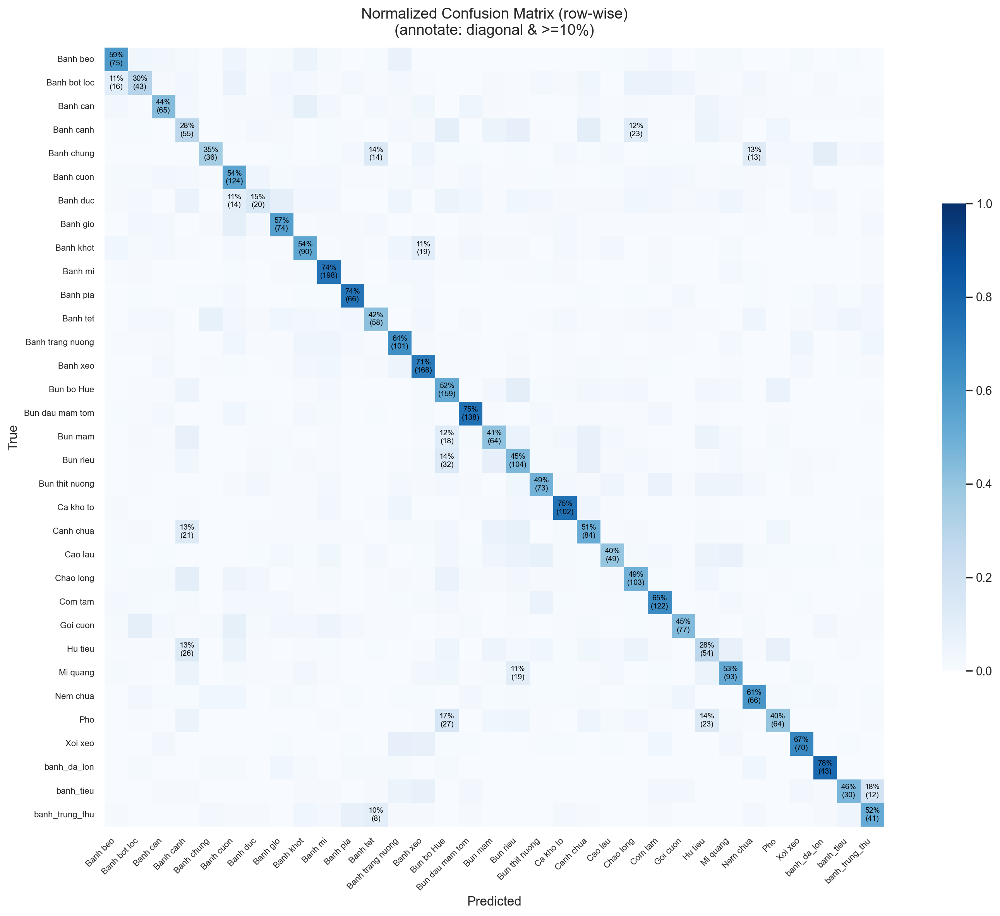

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# y_true, y_pred, class_names = [...]
cm_counts = confusion_matrix(y_true, y_pred, labels=range(len(class_names)))
cm = cm_counts.astype(float) / cm_counts.sum(axis=1, keepdims=True)  # chuẩn hoá theo hàng (recall)
cm = np.nan_to_num(cm)  # tránh NaN nếu lớp không có mẫu

# Ngưỡng để hiển thị số (chỉ annotate những ô >= threshold hoặc đường chéo)
THRESHOLD = 0.10  # 10%
fig, ax = plt.subplots(figsize=(16, 12), dpi=200)
sns.heatmap(
    cm, vmin=0, vmax=1, cmap="Blues", square=True, cbar_kws={'shrink': .6},
    xticklabels=class_names, yticklabels=class_names, ax=ax
)

# Annotations: phần trăm + (đếm) cho ô chéo và ô vượt ngưỡng
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        show = (i == j) or (cm[i, j] >= THRESHOLD)
        if show and (cm_counts[i, j] > 0):
            ax.text(j + 0.5, i + 0.5,
                    f"{cm[i, j]*100:.0f}%\n({cm_counts[i, j]})",
                    ha="center", va="center", fontsize=7, color="black")

# Trang trí
ax.set_xlabel("Predicted", fontsize=12)
ax.set_ylabel("True", fontsize=12)
ax.set_title("Normalized Confusion Matrix (row-wise)\n(annotate: diagonal & >=10%)", fontsize=14, pad=12)

# Xoay & thu nhỏ nhãn trục để đỡ chồng chữ
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=8)

plt.tight_layout()
plt.savefig("images/confusion_matrix_clean.png", dpi=300, bbox_inches="tight")
plt.show()


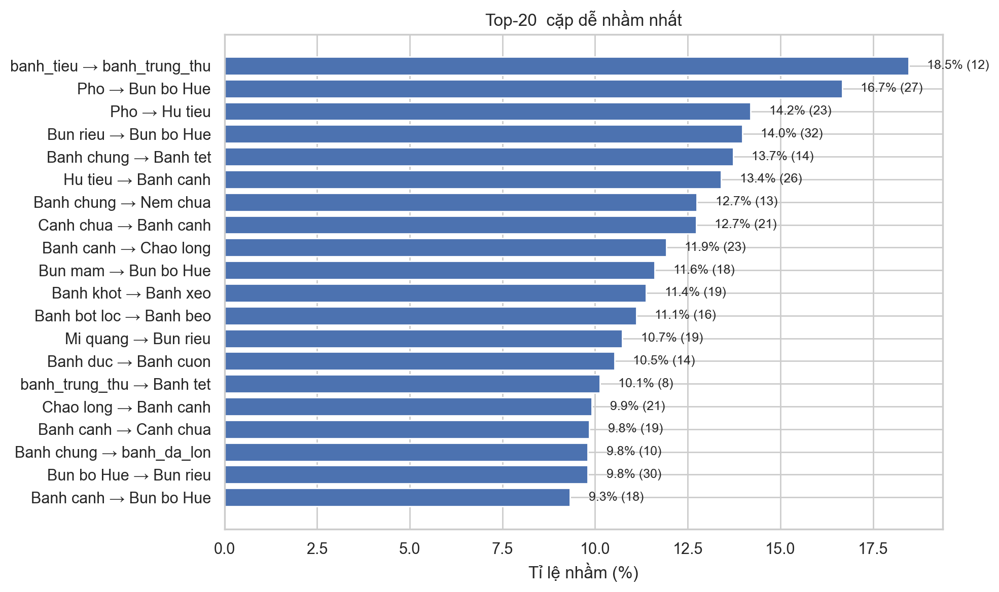

In [30]:
# Lấy 15 cặp true≠pred có tỉ lệ nhầm cao nhất (lọc theo %)
TOPK =20
pairs = []
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        if i != j and cm[i, j] > 0:
            pairs.append((class_names[i], class_names[j], cm[i, j], cm_counts[i, j]))

pairs.sort(key=lambda x: x[2], reverse=True)
topk = pairs[:TOPK]

import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(topk, columns=["True", "Predicted", "Rate", "Count"])
plt.figure(figsize=(10, 6), dpi=200)
plt.barh([f"{t} → {p}" for t, p, _, _ in topk], [r*100 for _, _, r, _ in topk])
plt.gca().invert_yaxis()
plt.xlabel("Tỉ lệ nhầm (%)")
plt.title("Top-20  cặp dễ nhầm nhất")
for i, (_, _, r, c) in enumerate(topk):
    plt.text(r*100 + 0.5, i, f"{r*100:.1f}% ({c})", va="center", fontsize=9)
plt.tight_layout()
plt.savefig("images/top_confusions.png", dpi=300, bbox_inches="tight")
plt.show()


In [32]:
# === 1) Imports
import os, numpy as np, torch
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score

os.makedirs("images", exist_ok=True)

# === 2) Lấy tên lớp (CLASS_NAMES)
# Nếu bạn tạo test_set bằng torchvision.datasets.ImageFolder
try:
    CLASS_NAMES = TEST_DIR #test_set.classes            # ví dụ ['Banh beo', 'Banh bot loc', ...]
except NameError:
    # fallback: nếu test_set chưa được tạo ở cell này
    from torchvision.datasets import ImageFolder
    test_set = ImageFolder(root_test, transform=test_transform)
    CLASS_NAMES = test_set.classes

NUM_CLASSES = len(CLASS_NAMES)

# === 3) Chấm dự đoán trên test_loader
model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for x, y in test_loader:
        x = x.to(device)
        logits = model(x)
        pred = logits.argmax(dim=1).cpu().numpy()
        y_pred.append(pred)
        y_true.append(y.numpy())

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

acc = accuracy_score(y_true, y_pred)
print(f"Accuracy (Test): {acc*100:.2f}%")

# === 4) Classification report (dict)
report_dict = classification_report(
    y_true, y_pred,
    target_names=CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

# Đưa về DataFrame cho dễ vẽ
df_report = pd.DataFrame(report_dict).T   # các dòng là từng lớp + các dòng overall
# Chỉ giữ các lớp (bỏ 'accuracy', 'macro avg', 'weighted avg' nếu muốn)
df_cls = df_report.iloc[:NUM_CLASSES][['precision','recall','f1-score']]

# === 5) VẼ HÌNH: Biểu đồ F1-score theo lớp (đã sort) ===
plt.figure(figsize=(12, max(6, NUM_CLASSES*0.3)))
plot_df = (df_cls['f1-score']*100).sort_values()   # %
sns.barplot(x=plot_df.values, y=plot_df.index, orient='h')
plt.title('F1-score theo lớp (đã sắp xếp)', fontsize=14)
plt.xlabel('F1-score (%)')
plt.ylabel('Lớp')
plt.tight_layout()
plt.savefig('images/per_class_f1.png', dpi=220, bbox_inches='tight')
plt.close()
print("✅ Đã lưu: images/per_class_f1.png")

# === 6) VẼ HÌNH: Bảng (table) Precision / Recall / F1 (%) ===
tbl = (df_cls*100).round(1)   # quy đổi %
fig_h = max(4, NUM_CLASSES*0.33)   # chiều cao linh hoạt theo số lớp
fig, ax = plt.subplots(figsize=(12, fig_h))
ax.axis('off')
table = ax.table(
    cellText=tbl.values,
    rowLabels=tbl.index,
    colLabels=['Precision %','Recall %','F1 %'],
    loc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 1.3)
ax.set_title('Bảng Precision / Recall / F1 theo lớp (%)', pad=10, fontsize=14)
fig.tight_layout()
fig.savefig('images/classification_report_table.png', dpi=250, bbox_inches='tight')
plt.close(fig)
print("✅ Đã lưu: images/classification_report_table.png")


Accuracy (Test): 51.80%


InvalidParameterError: The 'target_names' parameter of classification_report must be an array-like or None. Got 'C:/TRAIN/Deep Learning/vietnamese-foods/Images/Test' instead.

In [26]:
import pandas as pd

df_report = pd.DataFrame(report).T
df_report.index.name = "Class"
display(df_report.head())

# Lưu CSV
import os
os.makedirs("images", exist_ok=True)
csv_path = "images/classification_report.csv"
df_report.to_csv(csv_path, float_format="%.4f")
print("Đã lưu:", csv_path)


NameError: name 'report' is not defined

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

per_class = df_report.loc[CLASS_NAMES, ["f1-score","support"]].copy()
per_class["class"] = CLASS_NAMES
per_class = per_class.sort_values("f1-score")  # lớp yếu lên trên

plt.figure(figsize=(10, max(6, len(CLASS_NAMES)*0.25)))
sns.barplot(data=per_class, x="f1-score", y="class", color="#4C72B0")
for i,(f1,sup) in enumerate(zip(per_class["f1-score"], per_class["support"])):
    plt.text(f1+0.005, i, f"{f1*100:.1f}% ({int(sup)})", va="center", fontsize=9)
plt.xlim(0,1)
plt.xlabel("F1-score")
plt.ylabel("Lớp")
plt.title("F1-score theo từng lớp (thấp → cao)")
plt.tight_layout()
plt.savefig("images/per_class_f1.png", dpi=220)
plt.show()


NameError: name 'df_report' is not defined

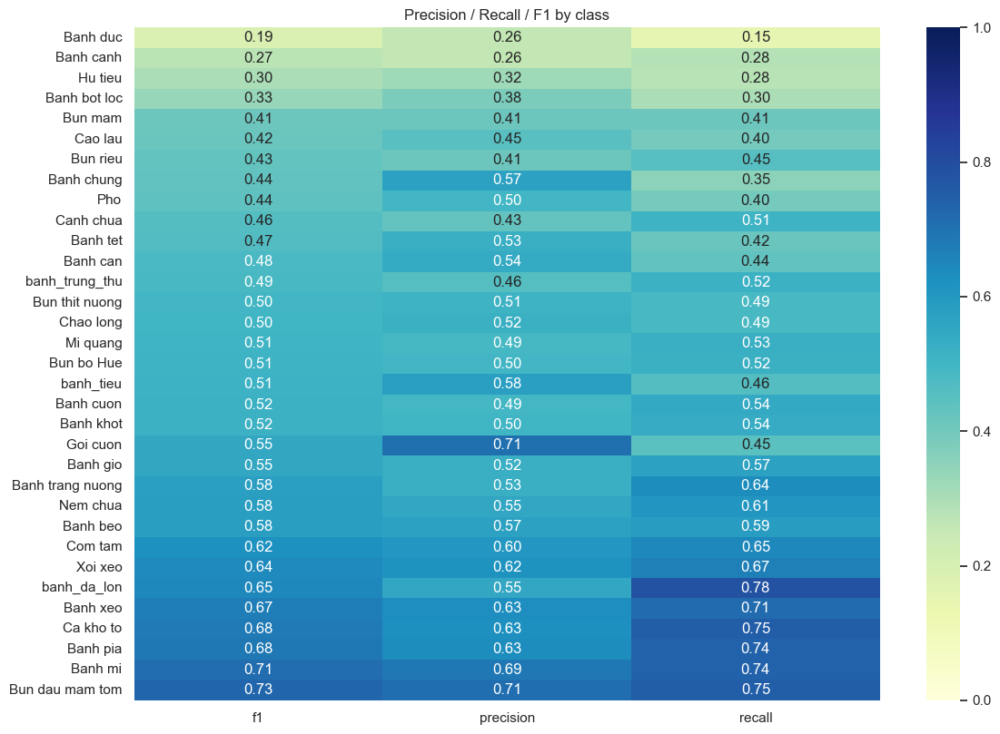

In [15]:
df_melt = df_prf.melt(id_vars="class", value_vars=["precision","recall","f1"],
                      var_name="metric", value_name="score")
order = df_prf.sort_values("f1")["class"].tolist()

plt.figure(figsize=(12, max(6, len(order)*0.25)))
pivot = df_melt.pivot(index="class", columns="metric", values="score").loc[order]
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlGnBu", vmin=0, vmax=1)
plt.title("Precision / Recall / F1 by class")
plt.xlabel(""); plt.ylabel("")
plt.tight_layout(); plt.show()


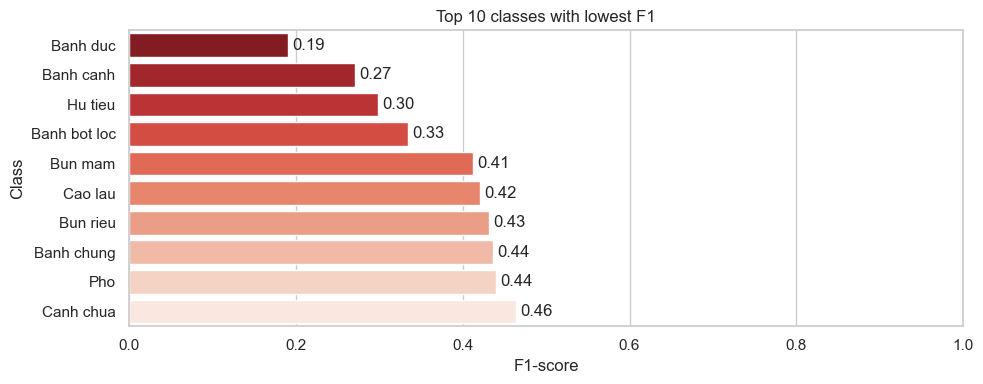

,class,precision,recall,f1,support
6,Banh duc,0.259740,0.150376,0.190476,133.0
3,Banh canh,0.259434,0.284974,0.271605,193.0
25,Hu tieu,0.323353,0.278351,0.299169,194.0
1,Banh bot loc,0.380531,0.298611,0.334630,144.0
16,Bun mam,0.412903,0.412903,0.412903,155.0
21,Cao lau,0.449541,0.395161,0.420601,124.0
17,Bun rieu,0.411067,0.454148,0.431535,229.0
4,Banh chung,0.571429,0.352941,0.436364,102.0
28,Pho,0.496124,0.395062,0.439863,162.0
20,Canh chua,0.426396,0.509091,0.464088,165.0


In [16]:
df_worst = df_prf.sort_values("f1", ascending=True).head(TOP_N_WORST)

plt.figure(figsize=(10, max(4, TOP_N_WORST*0.4)))
sns.barplot(data=df_worst, y="class", x="f1", palette="Reds_r")
plt.title(f"Top {TOP_N_WORST} classes with lowest F1")
plt.xlabel("F1-score"); plt.ylabel("Class")
for i, v in enumerate(df_worst["f1"]):
    plt.text(v+0.005, i, f"{v:.2f}", va="center")
plt.xlim(0,1)
plt.tight_layout(); plt.show()

df_worst


Top confused pairs (count, True, Pred):
   32 | Bun rieu -> Bun bo Hue
   30 | Bun bo Hue -> Bun rieu
   27 | Pho -> Bun bo Hue
   26 | Hu tieu -> Banh canh
   23 | Pho -> Hu tieu


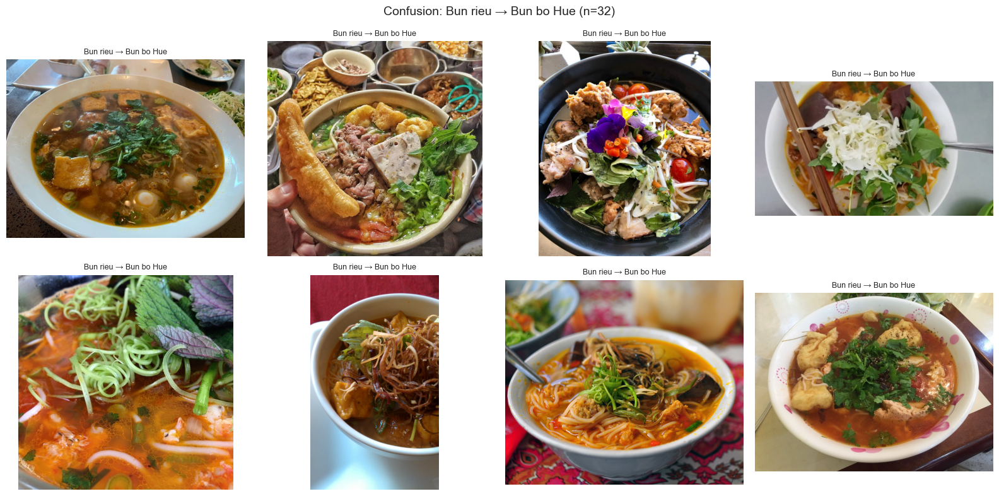

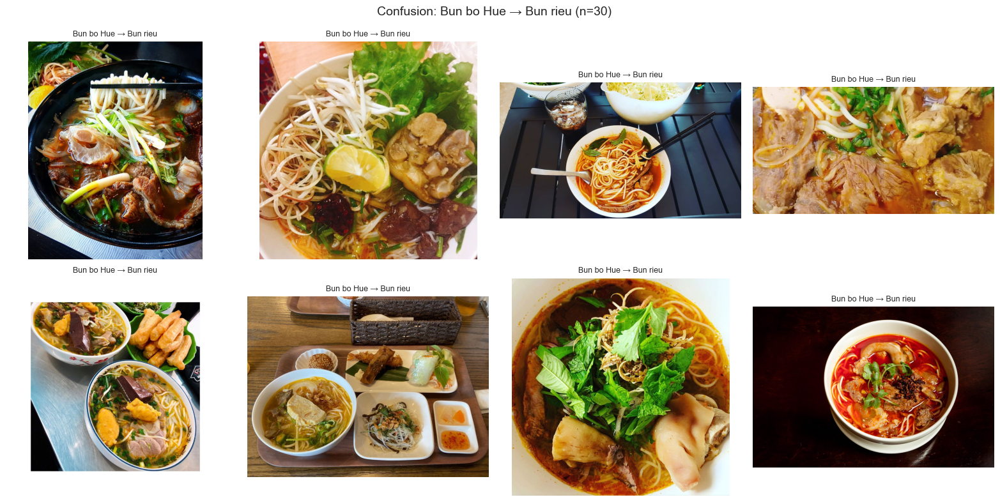

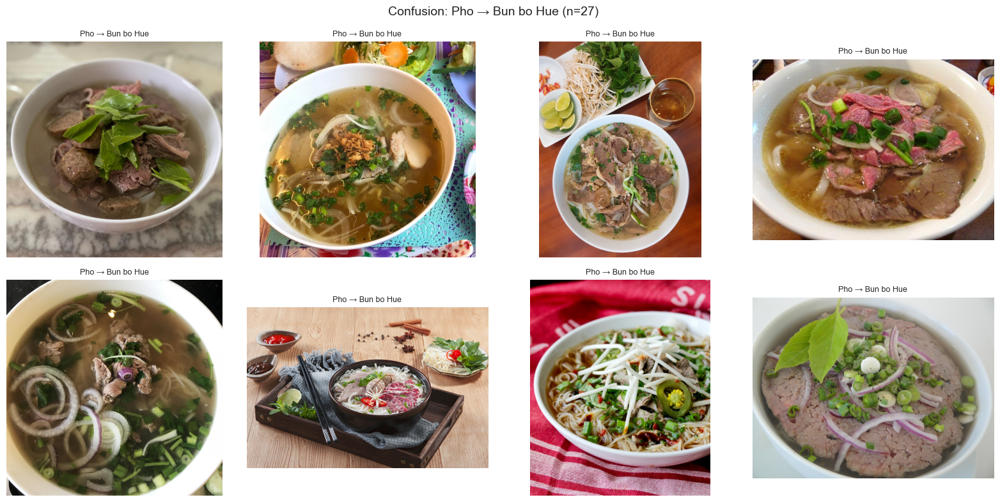

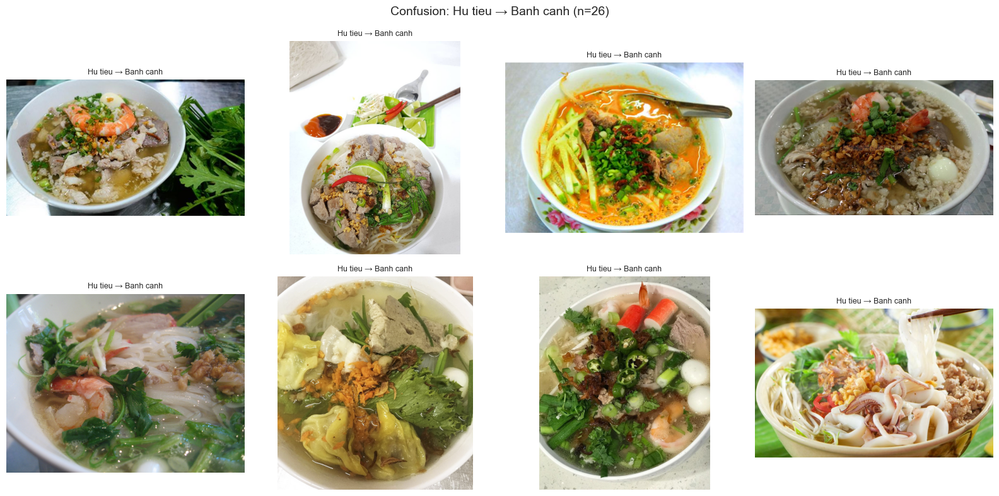

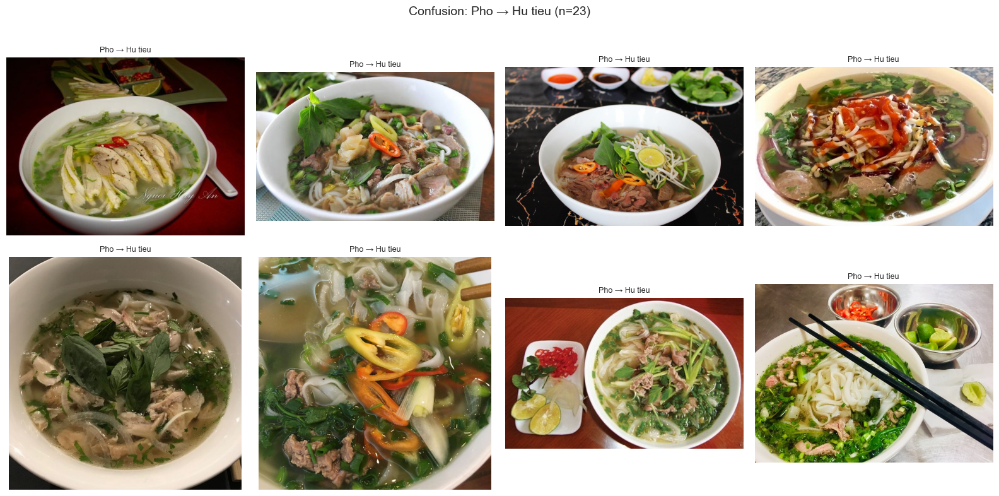

In [17]:
K = 5          # số cặp muốn xem
N_SAMPLES = 8  # số ảnh minh họa mỗi cặp

y_true_arr = np.asarray(y_true)
y_pred_arr = np.asarray(y_pred)

cm_counts = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))
pairs = []
for i in range(cm_counts.shape[0]):
    for j in range(cm_counts.shape[1]):
        if i == j:
            continue
        c = cm_counts[i, j]
        if c > 0:
            pairs.append((c, i, j))

pairs.sort(reverse=True)
top_pairs = pairs[:K]

print("Top confused pairs (count, True, Pred):")
for c, ti, pj in top_pairs:
    print(f"{c:5d} | {class_names[ti]} -> {class_names[pj]}")

for c, ti, pj in top_pairs:
    idxs = np.where((y_true_arr == ti) & (y_pred_arr == pj))[0]
    if len(idxs) == 0:
        continue
    pick = idxs[:N_SAMPLES]
    ncols = 4
    nrows = math.ceil(len(pick)/ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))
    axes = np.array(axes).reshape(nrows, ncols)
    for ax in axes.flat: 
        ax.axis("off")
    fig.suptitle(f"Confusion: {class_names[ti]} → {class_names[pj]} (n={len(idxs)})", fontsize=14)
    for ax, idx in zip(axes.flat, pick):
        path, _ = ds_test.samples[idx]  # ImageFolder trả (path, label)
        try:
            img = Image.open(path).convert("RGB")
            ax.imshow(img)
            ax.set_title(f"{class_names[ti]} → {class_names[pj]}", fontsize=9)
        except Exception as e:
            ax.set_title(f"Err: {e}", fontsize=8)
    plt.tight_layout(); plt.show()


In [18]:
out_dir = Path(OUT_DIR); out_dir.mkdir(parents=True, exist_ok=True)

# Lưu classification report text
rep_txt = classification_report(y_true, y_pred, target_names=class_names, digits=4, zero_division=0)
(out_dir / "classification_report.txt").write_text(
    f"Top-1 Acc: {acc1:.2f}%\n" + " | ".join([f"Top-{k}: {v:.2f}%" for k,v in topk.items()]) + "\n\n" + rep_txt,
    encoding="utf-8"
)

# Lưu normalized confusion matrix
plt.figure(figsize=(12,10))
sns.heatmap(cm_norm, cmap="Blues", xticklabels=class_names, yticklabels=class_names,
            annot=True, fmt=".2f", square=True, cbar=True)
plt.title("Normalized Confusion Matrix (row-wise)")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.savefig(out_dir / "confusion_matrix_normalized.png", dpi=180, bbox_inches="tight")
plt.close()

str(out_dir.resolve())


'C:\\Users\\Admin\\OneDrive\\DOCKER\\Apps\\DL-DuDoan33MonAnVietNam\\reports\\seaborn_eval'